In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-GQLYEALK.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-FYTGWFGD.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-AVNDTFWS.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-DQPFGFLS.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-FNEDYLHG.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-SKHGWRDQ.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-VCNPKDTR.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-SLPCWLYE.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-HGGDDSCG.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-FRYWYIPR.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-FDMQWPHN.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-VGTQFFLF.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-WSPTKKSK.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-EWQYRERI.tif
/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/MUC/MUC-YMAPFGQN

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
data_dir = '/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K'
filepaths = []
labels = []

folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        
        filepaths.append(fpath)
        labels.append(fold)

# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
df = pd.concat([Fseries, Lseries], axis= 1)

In [3]:
df

,filepaths,labels
0,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,MUC
1,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,MUC
2,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,MUC
3,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,MUC
4,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,MUC
...,...,...
99995,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,STR
99996,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,STR
99997,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,STR
99998,/kaggle/input/nct-crc-he-100k/NCT-CRC-HE-100K/...,STR


In [4]:
from sklearn.model_selection import train_test_split
strat = df['labels']
train_df, test_val_df = train_test_split(df,  train_size= 0.8, shuffle= True, random_state= 123, stratify= strat)

# valid and test dataframe
strat = test_val_df['labels']
valid_df, test_df = train_test_split(test_val_df,  train_size= 0.5, shuffle= True, random_state= 123, stratify= strat)

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 128
img_size = (224, 224)
channels = 3  # Grayscale images have 1 channel
img_shape = (img_size[0], img_size[1], channels)

# Add rescale=1/255.0 to normalize pixel values to [0, 1]
tr_gen = ImageDataGenerator(rescale=1./255)
ts_gen = ImageDataGenerator(rescale=1./255)

train_gen = tr_gen.flow_from_dataframe(
    train_df,
    x_col='filepaths',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',  # Change to grayscale
    shuffle=True,
    batch_size=batch_size
)

valid_gen = ts_gen.flow_from_dataframe(
    valid_df,
    x_col='filepaths',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',  # Change to grayscale
    shuffle=True,
    batch_size=batch_size
)

test_gen = ts_gen.flow_from_dataframe(
    test_df,
    x_col='filepaths',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',  # Change to grayscale
    shuffle=False,
    batch_size=batch_size
)

Found 80000 validated image filenames belonging to 9 classes.
Found 10000 validated image filenames belonging to 9 classes.
Found 10000 validated image filenames belonging to 9 classes.


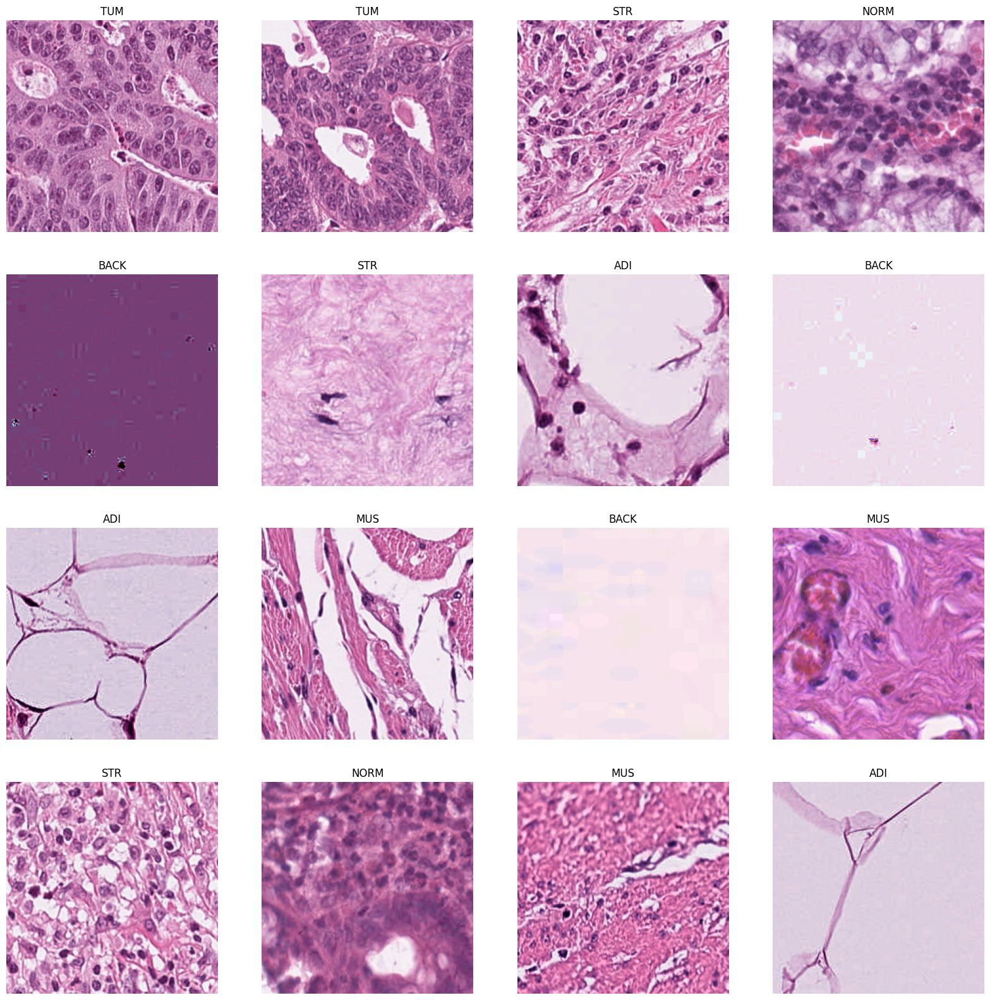

In [6]:
import matplotlib.pyplot as plt
g_dict = train_gen.class_indices      # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i]  # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name)
    plt.axis('off')
plt.show()

In [7]:
from keras.applications import xception
from tensorflow.keras.applications import Xception
from tensorflow.keras import layers, Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense ,  GlobalAveragePooling2D,Dropout


In [8]:
model=Sequential
# Load pre-trained DenseNet121 model without the top layer
base_model = xception.Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3),pooling='avg')
# Freeze the base model layers
base_model.trainable = False
#fully connected layer
model = Sequential([
    base_model,
    Dense(256, activation= 'relu'),
    Dropout(rate=0.5, seed=123),
    Dense(9, activation= 'softmax')
])

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
from tensorflow.keras.optimizers import Adam,SGD,Adamax
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [10]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
model.compile(optimizer=Adamax(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])

In [11]:
history = model.fit(
    train_gen,
    epochs=12,
    validation_data=(valid_gen),
    callbacks=[early_stopping]
)

Epoch 1/12


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1734468793.369936     119 service.cc:145] XLA service 0x7c679c001de0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734468793.370013     119 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734468793.370019     119 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
2024-12-17 20:53:21.158370: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng42{k2=1,k4=1,k5=1,k6=0,k7=0} for conv (f32[128,64,109,109]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,109,109]{3,2,1,0

625/625 ━━━━━━━━━━━━━━━━━━━━ 676s 1s/step - accuracy: 0.8636 - loss: 0.4425 - val_accuracy: 0.9448 - val_loss: 0.1760
Epoch 2/12
625/625 ━━━━━━━━━━━━━━━━━━━━ 374s 594ms/step - accuracy: 0.9366 - loss: 0.1952 - val_accuracy: 0.9525 - val_loss: 0.1586
Epoch 3/12
625/625 ━━━━━━━━━━━━━━━━━━━━ 372s 591ms/step - accuracy: 0.9433 - loss: 0.1720 - val_accuracy: 0.9570 - val_loss: 0.1380
Epoch 4/12
625/625 ━━━━━━━━━━━━━━━━━━━━ 371s 590ms/step - accuracy: 0.9487 - loss: 0.1530 - val_accuracy: 0.9603 - val_loss: 0.1296
Epoch 5/12
625/625 ━━━━━━━━━━━━━━━━━━━━ 360s 572ms/step - accuracy: 0.9561 - loss: 0.1315 - val_accuracy: 0.9620 - val_loss: 0.1242
Epoch 6/12
625/625 ━━━━━━━━━━━━━━━━━━━━ 338s 537ms/step - accuracy: 0.9597 - loss: 0.1218 - val_accuracy: 0.9626 - val_loss: 0.1244
Epoch 7/12
625/625 ━━━━━━━━━━━━━━━━━━━━ 337s 535ms/step - accuracy: 0.9620 - loss: 0.1137 - val_accuracy: 0.9636 - val_loss: 0.1183
Epoch 8/12
625/625 ━━━━━━━━━━━━━━━━━━━━ 338s 537ms/step - accuracy: 0.9628 - loss: 0.1108 

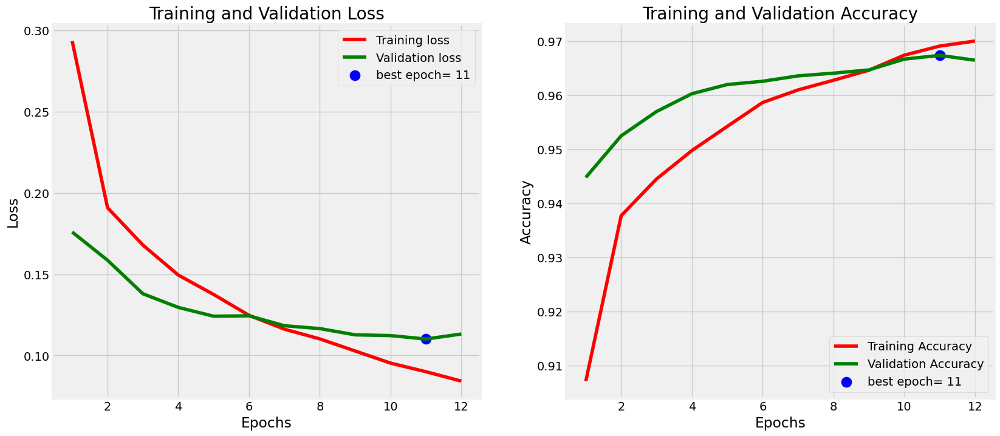

In [12]:
tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

# Plot training history
plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

In [13]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 40)
print("Valid Loss: ", valid_score[0])
print("Valid Accuracy: ", valid_score[1])
print('-' * 40)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

125/125 ━━━━━━━━━━━━━━━━━━━━ 60s 476ms/step - accuracy: 0.9860 - loss: 0.0444
125/125 ━━━━━━━━━━━━━━━━━━━━ 38s 296ms/step - accuracy: 0.9681 - loss: 0.1135


/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


125/125 ━━━━━━━━━━━━━━━━━━━━ 77s 611ms/step - accuracy: 0.9613 - loss: 0.1287
Train Loss:  0.04765717312693596
Train Accuracy:  0.9848750233650208
----------------------------------------
Valid Loss:  0.11014906316995621
Valid Accuracy:  0.9674000144004822
----------------------------------------
Test Loss:  0.1244078278541565
Test Accuracy:  0.9625999927520752


In [14]:
preds = model.predict(test_gen)
y_pred = np.argmax(preds, axis=1)

79/79 ━━━━━━━━━━━━━━━━━━━━ 39s 468ms/step


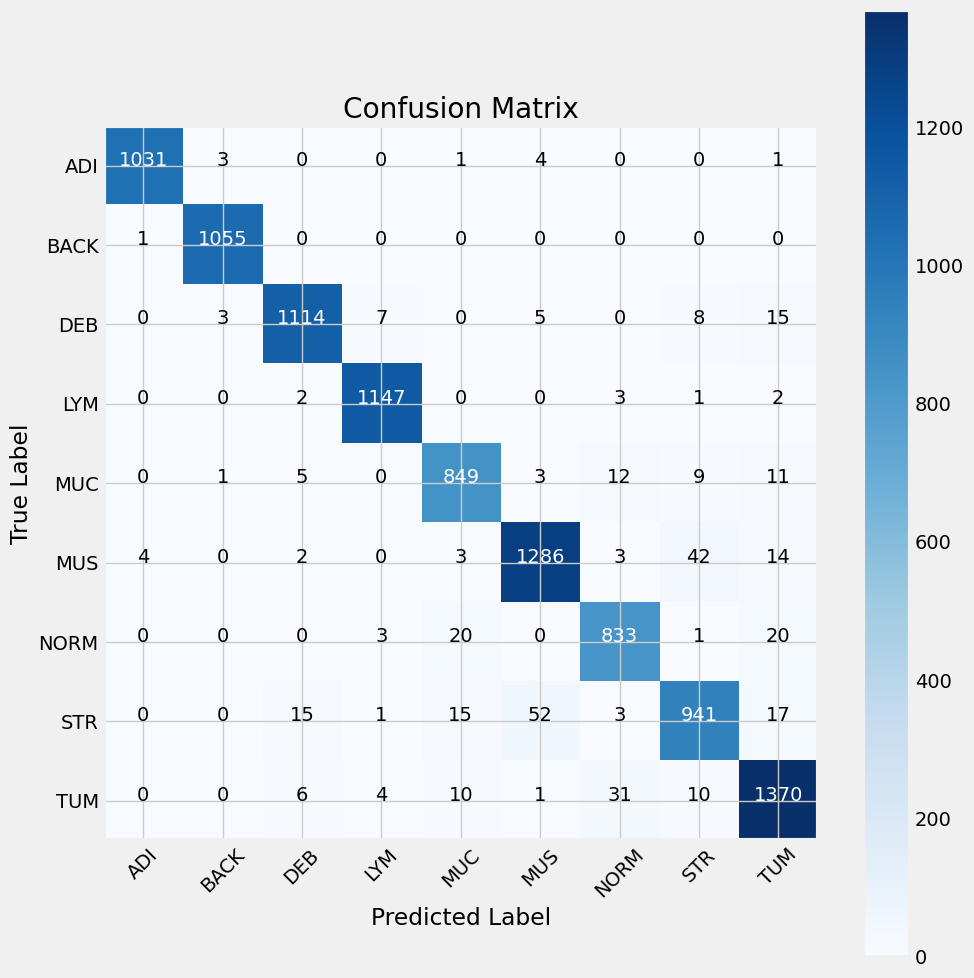

In [15]:
import itertools
from sklearn.metrics import confusion_matrix
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)


thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [16]:
from sklearn.metrics import classification_report

print(classification_report(test_gen.classes, y_pred, target_names= classes))

              precision    recall  f1-score   support

         ADI       1.00      0.99      0.99      1040
        BACK       0.99      1.00      1.00      1056
         DEB       0.97      0.97      0.97      1152
         LYM       0.99      0.99      0.99      1155
         MUC       0.95      0.95      0.95       890
         MUS       0.95      0.95      0.95      1354
        NORM       0.94      0.95      0.95       877
         STR       0.93      0.90      0.92      1044
         TUM       0.94      0.96      0.95      1432

    accuracy                           0.96     10000
   macro avg       0.96      0.96      0.96     10000
weighted avg       0.96      0.96      0.96     10000



79/79 ━━━━━━━━━━━━━━━━━━━━ 36s 454ms/step


/tmp/ipykernel_23/501982819.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", n_classes)  # Color map for multiple classes


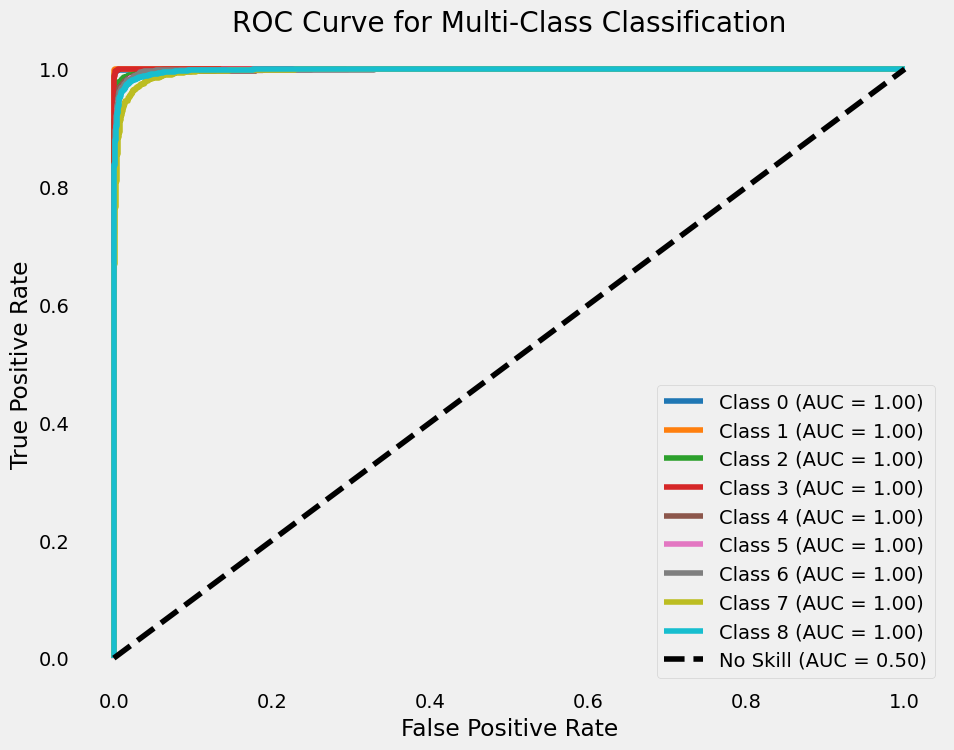

In [17]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# Get predicted probabilities on the test set
y_pred = model.predict(test_gen)

# Get true labels from the test generator
y_true = test_gen.classes  # True class indices
y_true = np.eye(len(test_gen.class_indices))[y_true]  # Convert to one-hot-encoded format

# Number of classes
n_classes = y_true.shape[1]

# Initialize variables to store ROC curve data
fpr = dict()  # False Positive Rate
tpr = dict()  # True Positive Rate
roc_auc = dict()  # Area Under the Curve

# Compute ROC curve and AUC for each class
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curves
plt.figure(figsize=(10, 8))
colors = plt.cm.get_cmap("tab10", n_classes)  # Color map for multiple classes

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})", color=colors(i))

# Plot diagonal (no-skill classifier)
plt.plot([0, 1], [0, 1], 'k--', label="No Skill (AUC = 0.50)")

# Add plot labels and legend
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Multi-Class Classification")
plt.legend(loc="lower right")
plt.grid()
plt.show()

In [18]:
model.save("model.h5")